In [ ]:
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118


Looking in indexes: https://download.pytorch.org/whl/cu118
INFO: pip is looking at multiple versions of torch to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 85.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 57.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 105.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.9/663.9 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.1/204.1 MB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 MB 8

In [ ]:
import platform
import tensorflow as tf
import torch
import os

# Cek versi Python
print("Python Version:", platform.python_version())

# Cek GPU yang tersedia
gpu_info = tf.config.list_physical_devices('GPU')
if gpu_info:
    print("\nGPU TensorFlow Info:")
    print(tf.config.experimental.get_device_details(gpu_info[0]))
else:
    print("\nNo GPU available for TensorFlow.")

# Cek GPU untuk PyTorch
if torch.cuda.is_available():
    print("\nPyTorch GPU Info:")
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("GPU Memory:", f"{torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("\nNo GPU available for PyTorch.")

# Cek informasi perangkat keras lainnya
print("\nHardware Info:")
print("Number of CPUs:", os.cpu_count())


Python Version: 3.11.11

GPU TensorFlow Info:
{'compute_capability': (7, 5), 'device_name': 'Tesla T4'}

PyTorch GPU Info:
GPU Name: Tesla T4
GPU Memory: 15.83 GB

Hardware Info:
Number of CPUs: 2


In [11]:
!pip install ultralytics

load dataset


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="EY2pDRbKs0yScLZ5S4ks")
project = rf.workspace("shootdetectoryolo").project("deteksi-shooting-basket")
version = project.version(11)
dataset = version.download("yolov9")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 98.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Deteksi-Shooting-basket-11 in yolov8:: 100%|██████████| 1264/1264 [00:00<00:00, 7207.17it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Traning model

In [ ]:
from ultralytics import YOLO

# Memuat model YOLOv9m
model = YOLO("yolov9m.pt")  

# Melatih model dengan optimizer SGD
results = model.train(
    data="/content/Deteksi-Shooting-basket-11/data.yaml",  # Path ke data.yaml
    epochs=100,                                             # Jumlah epoch pelatihan
    imgsz=640,                                              # Ukuran input gambar
    lr0=0.0001,                                              # Learning rate awal
    momentum=0.999,                                         # Momentum untuk optimizer
    optimizer="SGD",                                        # OPTIMIZER diubah ke Adam
    save=True,                                              # Simpan model
    save_period=10,                                         # Simpan setiap 10 epoch
    name="yolov9m_SGD_lr0.0001_m0.999"                      # Nama eksperimen
)

# Simpan model hasil training (opsional)
model.save("yolov9m_SGD_lr0.0001_m0.999")


100%|██████████| 39.1M/39.1M [00:00<00:00, 124MB/s]


Ultralytics 8.3.111 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9m.pt, data=/content/Deteksi-Shooting-basket-11/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=8, project=None, name=yolov9m_SGD_lr0.0001_m0.999, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

train: Scanning /content/Deteksi-Shooting-basket-11/train/labels.cache... 438 images, 0 backgrounds, 0 corrupt: 100%|██████████| 438/438 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 696.5±461.8 MB/s, size: 53.5 KB)


val: Scanning /content/Deteksi-Shooting-basket-11/valid/labels.cache... 123 images, 0 backgrounds, 0 corrupt: 100%|██████████| 123/123 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov9m_SGD_lr0.0001_m0.999/labels.jpg... 
optimizer: SGD(lr=0.0001, momentum=0.999) with parameter groups 149 weight(decay=0.0), 156 weight(decay=0.0005), 155 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov9m_SGD_lr0.0001_m0.999
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      7.91G       1.43      4.389      1.273         11        640: 100%|██████████| 28/28 [00:19<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        123        182      0.268       0.06     0.0971     0.0486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.68G      1.376      3.478      1.251         16        640: 100%|██████████| 28/28 [00:19<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.60it/s]

                   all        123        182      0.892      0.325      0.371      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      7.66G      1.115      2.324      1.154          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        123        182      0.611      0.486      0.532      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.69G      1.107      2.035      1.141         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        123        182      0.754      0.553      0.614      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       7.7G     0.9675      1.513      1.047         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        123        182      0.729      0.616       0.67       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.69G     0.9391      1.158      1.071         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        123        182      0.804      0.676      0.707      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       7.7G     0.8812      1.019      1.005          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all        123        182      0.818      0.683       0.74      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       7.7G     0.8553     0.9306     0.9937         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.812       0.74      0.775      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.71G     0.7771     0.7239     0.9604         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.866       0.77       0.82       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      7.71G     0.8469     0.7407      0.995          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        123        182      0.915      0.772      0.841      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100       7.7G     0.7741     0.6182     0.9533         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.907      0.764      0.845      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.69G     0.8301      0.653     0.9709         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]

                   all        123        182      0.856      0.806      0.862      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      7.69G     0.8097     0.6058      0.976         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.903      0.797      0.865      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100       7.7G     0.7989     0.5591     0.9647         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        123        182      0.915       0.81       0.87      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100       7.7G     0.7912     0.5297     0.9611         20        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.915      0.828      0.877       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.69G     0.7553     0.5017     0.9345         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182      0.891      0.873      0.887      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.71G      0.745     0.5142      0.932         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.886      0.864       0.89      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.71G     0.7633     0.5046     0.9545         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.76it/s]

                   all        123        182      0.891      0.869      0.894      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.71G     0.7362      0.455     0.9224         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.949      0.852      0.909      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.71G      0.746     0.4579     0.9367         17        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.932      0.866      0.914      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.71G     0.7551     0.4505     0.9375         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.954      0.847      0.918      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       7.7G     0.7507     0.4604     0.9325         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all        123        182      0.959      0.839      0.913      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.69G     0.7641     0.4536     0.9197         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.906      0.877      0.917      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.69G     0.7108     0.4324     0.9218          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.906      0.885       0.92      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.71G     0.7362     0.4512     0.9319         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        123        182      0.899      0.908      0.931      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.69G     0.7229     0.4284     0.9223         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.896      0.903      0.933      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       7.7G     0.7356     0.4257     0.9237         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.889      0.908      0.934      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      7.69G     0.7437     0.4807     0.9311          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.876      0.908      0.932       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.69G     0.7384     0.4256     0.9411          6        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]

                   all        123        182      0.901      0.903      0.938      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.71G     0.7205     0.4319     0.9258         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182      0.909      0.896      0.941      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       7.7G      0.706     0.4133     0.9176         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.937      0.885      0.943      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.71G     0.7096     0.4135     0.9088         17        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182      0.945      0.888       0.94      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.69G     0.6889     0.4239     0.9065         16        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182       0.95      0.876      0.939      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.69G     0.7145     0.4377     0.9326         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182       0.93      0.895      0.939      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      7.71G     0.6872     0.4012     0.8952         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.946      0.874      0.937      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.69G     0.7114     0.4306     0.9169         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        123        182      0.936      0.877       0.93      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       7.7G     0.6825     0.3964     0.8886         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.927      0.894      0.931        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.71G     0.7003     0.4253     0.9055         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.939      0.903      0.939      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.71G     0.7007     0.4101     0.9041         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        123        182      0.967      0.889      0.938        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.71G     0.6673     0.4087     0.9084         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182      0.944      0.897      0.936      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       7.7G     0.6782     0.4006     0.8975         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.938      0.901      0.937      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      7.69G     0.6762     0.4021     0.8977         13        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.948      0.903      0.937      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.69G     0.6883     0.4058     0.9125          7        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.69it/s]

                   all        123        182      0.949      0.903      0.938      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.71G     0.7205     0.4263     0.9134         13        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.939      0.902      0.937      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.69G     0.7089     0.3981     0.8948          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182       0.95      0.904      0.938      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      7.69G     0.6789     0.4106     0.8924         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.939      0.903      0.944      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.69G     0.6681     0.3986     0.8972         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        123        182      0.934       0.91      0.946      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.69G     0.6684      0.385      0.893         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.938       0.91      0.947      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.71G     0.6894     0.4108     0.9026         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.929      0.903      0.944       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.69G     0.6907     0.3878     0.9139          5        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        123        182       0.93       0.91      0.946      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.71G     0.6693     0.3875       0.88         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182       0.93      0.904      0.946      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.69G     0.6636      0.381     0.8791          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.944      0.894      0.943      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.71G     0.6663     0.4029     0.8913         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.951      0.889      0.942      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.71G     0.6793     0.3909     0.8853          7        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        123        182      0.951       0.89      0.938      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.69G     0.6715     0.4158     0.8978          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182       0.95      0.889      0.934       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.71G     0.6833     0.4171     0.9022         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182       0.95      0.887      0.934      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.69G     0.6715     0.3899     0.8854          6        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.949      0.871      0.933      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.69G     0.6413     0.3758     0.8772          7        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        123        182      0.965      0.864       0.93      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.69G     0.6695      0.389     0.8876         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.973      0.864       0.93      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      7.71G     0.6385     0.3779     0.8757          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.949      0.864      0.935      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.71G     0.6506     0.3796     0.8931         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        123        182      0.917      0.898      0.933      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       7.7G     0.6613     0.3776     0.8909         16        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.923      0.897       0.93      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.71G     0.6481     0.3803     0.8721         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.933      0.897      0.929      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100       7.7G     0.6331     0.3703     0.8556          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.935      0.896      0.929      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.71G     0.6307     0.3588     0.8961         13        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]

                   all        123        182      0.927      0.897       0.93      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.69G     0.6263     0.3693     0.8777         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.934       0.91      0.931      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.71G     0.6354     0.3601       0.88         19        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.938      0.903      0.932      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.69G     0.6283      0.359     0.8915         16        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all        123        182      0.944      0.903      0.933      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100       7.7G     0.6281     0.3663     0.8828         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        123        182      0.946       0.91      0.934      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.69G     0.6266     0.3755      0.877          6        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.945       0.91      0.934      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100       7.7G     0.6437     0.3576     0.8871         13        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.955      0.907      0.934      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.71G     0.6248     0.3563     0.8799          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.71it/s]

                   all        123        182      0.951      0.903      0.934      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.69G     0.6213     0.3708     0.8869         19        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182      0.942      0.913      0.933      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      7.69G     0.6015     0.3558     0.8717          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182       0.94      0.911      0.931      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.71G     0.6231     0.3618     0.8889          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        123        182      0.935      0.916      0.929      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.71G     0.6017     0.3354     0.8688         16        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182       0.94       0.91      0.927      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       7.7G     0.6114     0.3705     0.8676         20        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182      0.945      0.903      0.927      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.71G      0.623     0.3576     0.8732         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.942       0.91      0.925      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      7.69G     0.6093     0.3693     0.8773         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]

                   all        123        182      0.927       0.91      0.924      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.71G     0.6184     0.3608     0.8773          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.915      0.921      0.923      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100       7.7G     0.6152     0.3585      0.875         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        123        182      0.915      0.923      0.921      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      7.69G      0.596     0.3504     0.8771         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.912      0.923      0.919      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.69G     0.6236     0.3472      0.863          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        123        182      0.917      0.916      0.917      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.71G     0.6035     0.3645      0.863         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.914      0.914      0.916        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100       7.7G     0.5787     0.3345     0.8715         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.76it/s]

                   all        123        182      0.909      0.912      0.916      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.71G     0.6125     0.3701     0.8822         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all        123        182      0.909      0.913      0.917      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.71G     0.6079     0.3548     0.8728         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.912        0.9      0.917      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.69G     0.5834     0.3388     0.8669         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all        123        182      0.928      0.884      0.916      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.71G     0.5817     0.3325     0.8653         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.905      0.915      0.919      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.71G     0.6048     0.3421     0.8692          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]

                   all        123        182      0.946      0.877      0.918      0.704


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.69G     0.6029     0.3472     0.8675         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.944      0.891       0.92      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      7.69G     0.5881     0.3307      0.877          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182      0.942      0.889      0.918      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      7.69G     0.5791     0.3245     0.8766         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        123        182      0.941      0.889      0.918      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      7.69G     0.5918     0.3365     0.8771          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.942      0.885      0.919      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      7.69G      0.574     0.3328     0.8674          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.944       0.89      0.918      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      7.69G     0.5845     0.3288     0.8684         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182      0.938      0.891      0.918      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.69G      0.589     0.3222       0.87         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        123        182      0.934      0.892       0.92      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      7.69G     0.5727     0.3312     0.8726          6        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.935      0.892       0.92      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      7.69G     0.5624     0.3204     0.8555         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.936      0.892      0.921      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.69G     0.5749     0.3181     0.8617          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        123        182      0.935      0.893      0.922       0.71



100 epochs completed in 0.606 hours.
Optimizer stripped from runs/detect/yolov9m_SGD_lr0.0001_m0.999/weights/last.pt, 40.8MB
Optimizer stripped from runs/detect/yolov9m_SGD_lr0.0001_m0.999/weights/best.pt, 40.8MB

Validating runs/detect/yolov9m_SGD_lr0.0001_m0.999/weights/best.pt...
Ultralytics 8.3.111 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9m summary (fused): 151 layers, 20,014,438 parameters, 0 gradients, 76.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


                   all        123        182       0.93      0.906      0.946      0.726
            Basketball         76         76      0.886      0.821      0.896      0.578
       Basketball Hoop        106        106      0.974      0.991      0.995      0.874
Speed: 0.3ms preprocess, 13.8ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/yolov9m_SGD_lr0.0001_m0.999


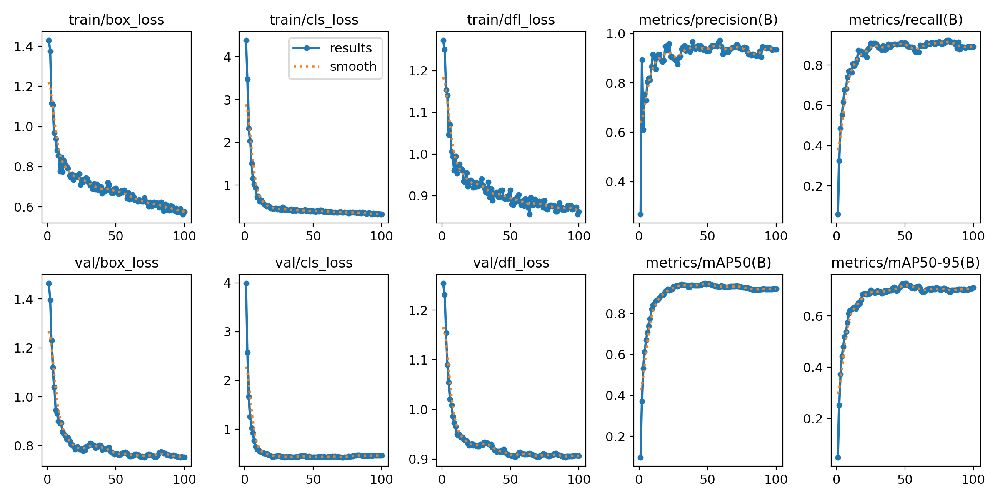

In [ ]:
import os
from IPython.display import Image as IPyImage

# Path ke folder hasil training
train_folder = "runs/detect/yolov9m_SGD_lr0.0001_m0.999"  

# Path ke file results.png
results_image_path = os.path.join(train_folder, "results.png")

# Periksa keberadaan file dan tampilkan
if os.path.exists(results_image_path):
    display(IPyImage(filename=results_image_path, width=600))
else:
    print("File 'results.png' tidak ditemukan. Pastikan proses training selesai dan file tersedia.")


In [ ]:
from ultralytics import YOLO

# Load model hasil training
model = YOLO("runs/detect/yolov9m_SGD_lr0.0001_m0.999/weights/best.pt")

# Jalankan inferensi pada folder test
results = model.predict(source="/content/Deteksi-Shooting-basket-11/test/images", save=True)



image 1/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0007_jpg.rf.c50d8e04c5c44c5adfc637292629977f.jpg: 640x640 1 Basketball, 40.2ms
image 2/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0009_jpg.rf.dae8363a59687ed34abdebd3f28a2d5e.jpg: 640x640 1 Basketball, 37.8ms
image 3/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0011_jpg.rf.3b14dc8329870a55746c44080f943429.jpg: 640x640 (no detections), 37.8ms
image 4/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0025_jpg.rf.ef50d41096b536faccfd21daeb1014f1.jpg: 640x640 1 Basketball, 37.8ms
image 5/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0038_jpg.rf.1ca1d18eb48a23955391642020b913d8.jpg: 640x640 1 Basketball, 1 Basketball Hoop, 37.8ms
image 6/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0047_jpg.rf.b66d7d10aaaa84c25e8101dd5997cb7c.jpg: 640x640 2 Basketballs, 23.7ms
image 7/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0048_jpg.rf.553f649e151e562f4798c8ee68f3a970.jp

# TESTING MODEL
melihat boundingbox yang terprediksi oleh model

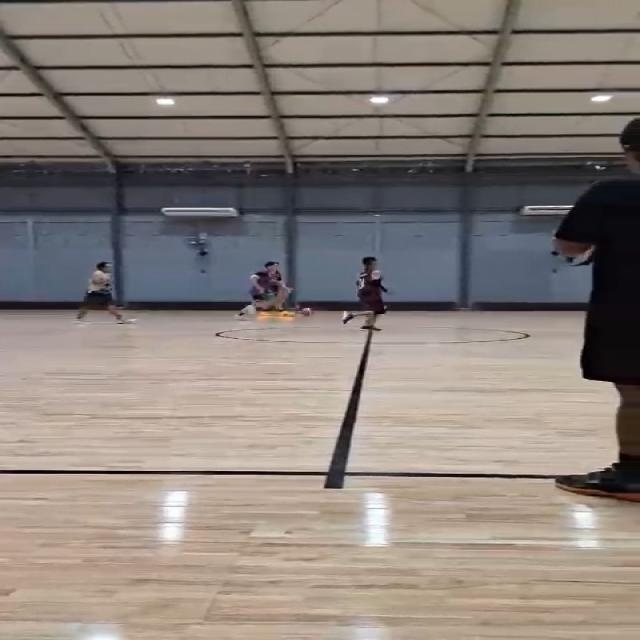

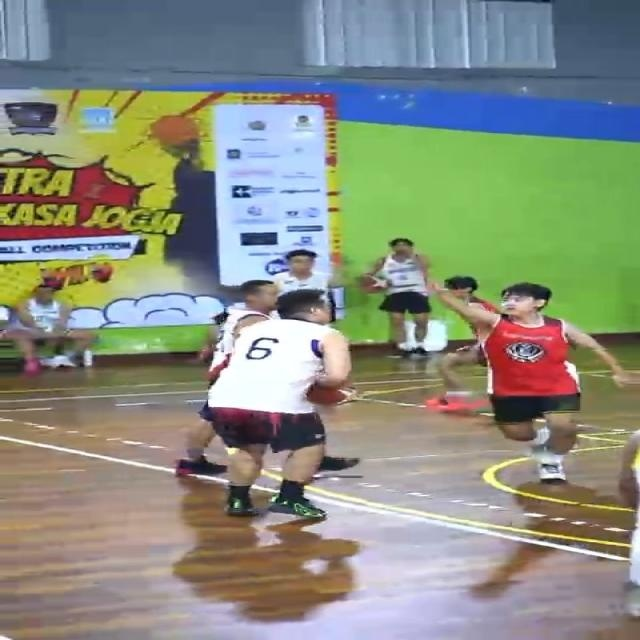

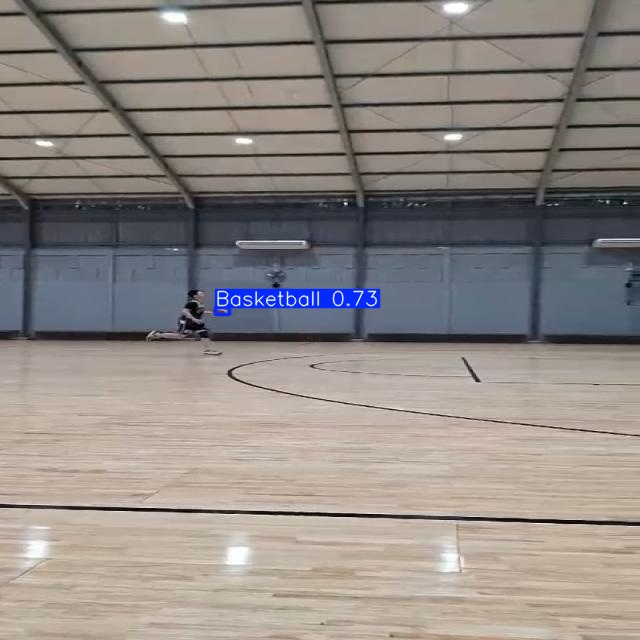

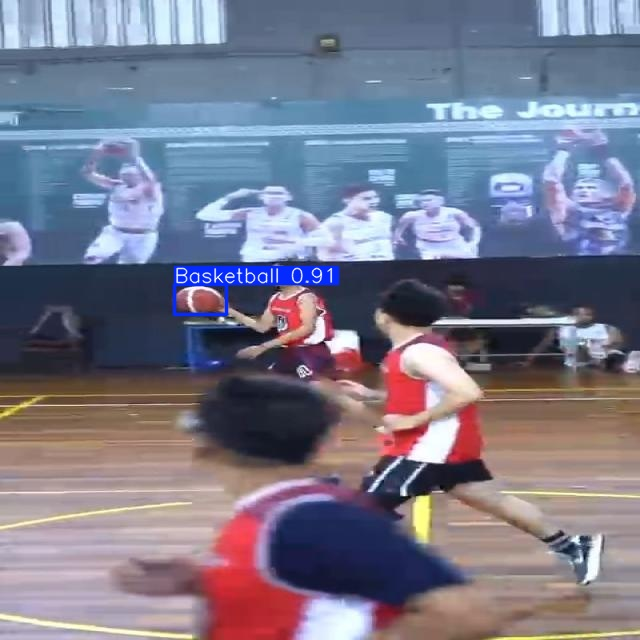

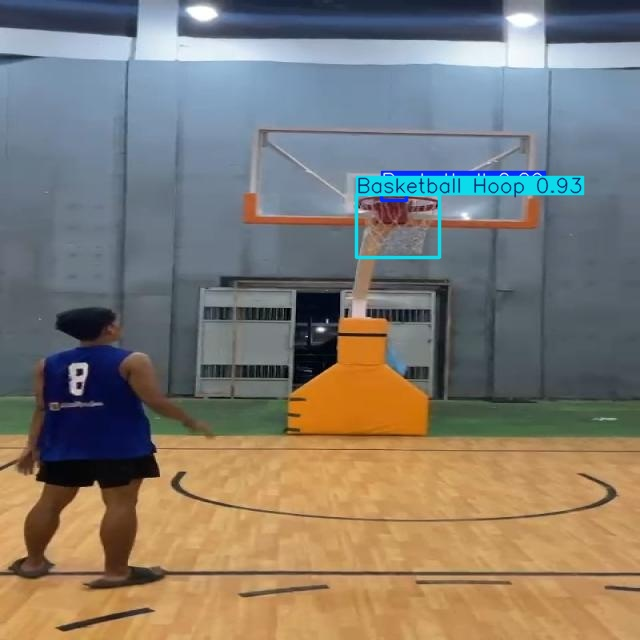

...

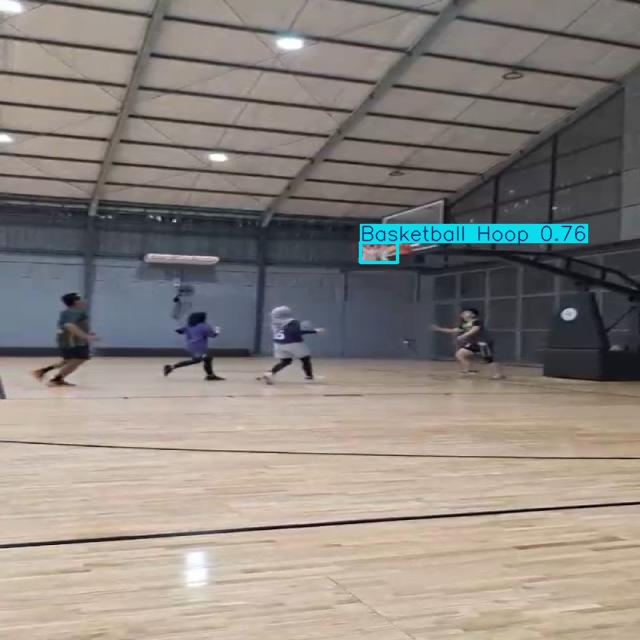

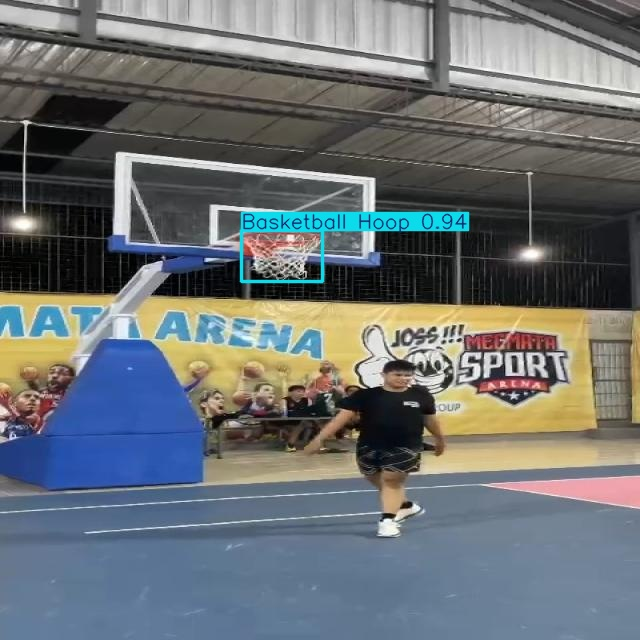

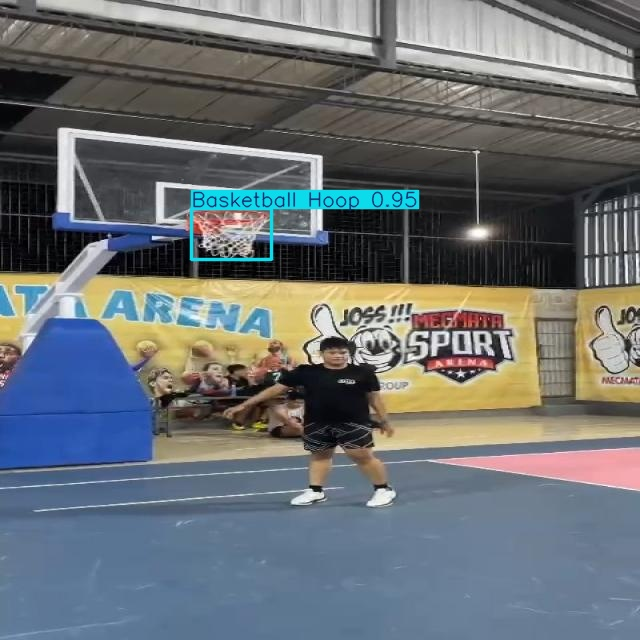

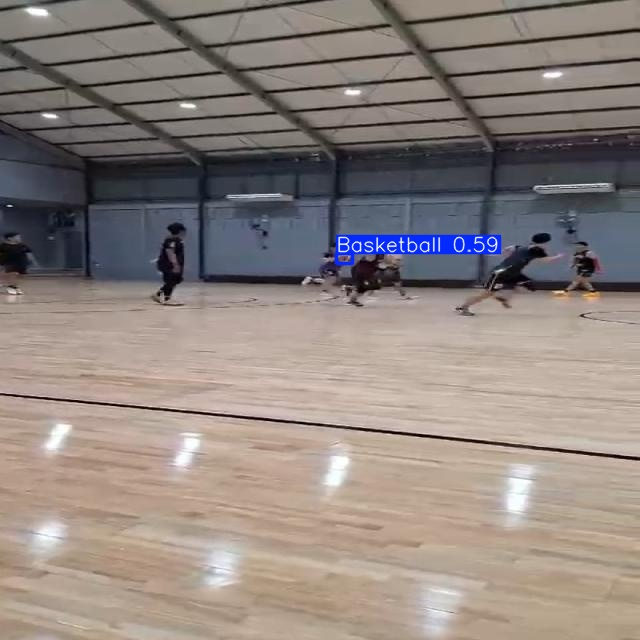

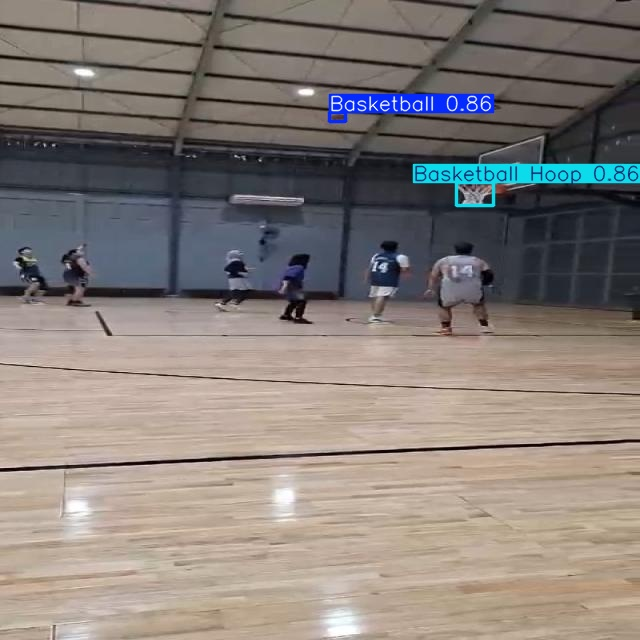

In [ ]:
import os
from IPython.display import Image, display

# Path hasil prediksi
pred_path = "runs/detect/predict2"

# Tampilkan semua gambar hasil prediksi
for img_file in os.listdir(pred_path):
    if img_file.endswith(".jpg") or img_file.endswith(".png"):
        display(Image(filename=os.path.join(pred_path, img_file), width=800))


# TESTING REALTIME

In [1]:
from ultralytics import YOLO
import cv2

# Memuat model
model = YOLO('E:\KULIAH\SKRIPSI\PROGRAM/yolov9m_SGD_lr0.0001_m0.999.pt')

# Input dan output video
input_video = 'E:\KULIAH\SKRIPSI\PROGRAM\Bangteo2.mp4'
cap = cv2.VideoCapture(input_video)

# Memeriksa apakah video berhasil dibuka
if not cap.isOpened():
    print("Error: Tidak dapat membuka video")
    exit()

# Properti Video
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Output video
output_video = 'E:\KULIAH\SKRIPSI\PROGRAM\OUTPUT FIX\ini nyoba program baru\Output_Bangteo2_yolov9m_SGD_lr0.0001_m0.999.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video, fourcc, fps, (frame_width, frame_height))

# Variabel untuk melacak lintasan bola, posisi ring, skor, dan percobaan
basket_trajectory = []
ring_position = None
score = 0
attempts = 0
MAX_TRAJECTORY_POINTS = 15

# Untuk rata-rata confidence
basketball_confidences = []
hoop_confidences = []

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)

    for result in results:
        for box in result.boxes:
            confidence = float(box.conf)
            x1, y1, x2, y2 = box.xyxy[0].int().tolist()
            class_id = int(box.cls)
            class_names = ['basketball', 'basketball hoop']

            if class_id < len(class_names):
                label = class_names[class_id]

                # Threshold
                if label == 'basketball' and confidence < 0.80:
                    continue
                if label == 'basketball hoop' and confidence < 0.80:
                    continue

                color = (0, 255, 0) if label == 'basketball' else (255, 0, 0)
                cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                cv2.putText(frame, f"{label} {confidence:.2f}", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                if label == 'basketball':
                    ball_center = ((x1 + x2) // 2, (y1 + y2) // 2)
                    basket_trajectory.append(ball_center)

                    if len(basket_trajectory) > MAX_TRAJECTORY_POINTS:
                        basket_trajectory.pop(0)

                    for point in basket_trajectory:
                        cv2.circle(frame, point, 3, (0, 255, 255), -1)

                    basketball_confidences.append(confidence)

                elif label == 'basketball hoop':
                    ring_position = (x1, y1, x2, y2)
                    hoop_confidences.append(confidence)

    # Cek dan gambar posisi ring
    if ring_position:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4
        # cv2.line(frame, (x1, ring_bottom_y), (x2, ring_bottom_y), (0, 0, 255), 2)

    # Deteksi tembakan masuk
    if ring_position and len(basket_trajectory) > 1:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4
        Xr1 = x1
        Xr2 = x2

        for i in range(1, len(basket_trajectory)):
            prev_y = basket_trajectory[i - 1][1]
            curr_y = basket_trajectory[i][1]
            prev_x = basket_trajectory[i - 1][0]
            curr_x = basket_trajectory[i][0]

            if prev_y < ring_bottom_y and curr_y >= ring_bottom_y:
                attempts += 1
                if curr_x < Xr1 or curr_x > Xr2:
                    print("Tembakan keluar dari batas kiri/kanan ring!")
                    basket_trajectory = []
                    break

                score += 1
                print(f"Tembakan masuk! Skor saat ini: {score}, Percobaan: {attempts}")
                basket_trajectory = []
                break

    fg_percentage = (score / attempts * 100) if attempts > 0 else 0.00

    # Rata-rata confidence
    avg_basketball_conf = sum(basketball_confidences) / len(basketball_confidences) if basketball_confidences else 0.0
    avg_hoop_conf = sum(hoop_confidences) / len(hoop_confidences) if hoop_confidences else 0.0

    # Tampilkan hasil di frame
    cv2.putText(frame, f"Score: {score} | Attempts: {attempts} | FG%: {fg_percentage:.2f}%", 
                (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (8, 255, 255), 2)

    cv2.putText(frame, f"Avg Basketball Conf: {avg_basketball_conf:.2f}", 
                (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    cv2.putText(frame, f"Avg Hoop Conf: {avg_hoop_conf:.2f}", 
                (10, 80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    out.write(frame)
    cv2.imshow('Detection', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video telah diproses dan disimpan sebagai {output_video}")



WARNING  Python>=3.10 is required, but Python==3.9.13 is currently installed 

0: 640x384 1 Basketball Hoop, 326.0ms
Speed: 6.6ms preprocess, 326.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 275.4ms
Speed: 4.9ms preprocess, 275.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 320.5ms
Speed: 2.5ms preprocess, 320.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 331.9ms
Speed: 4.0ms preprocess, 331.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 286.9ms
Speed: 2.0ms preprocess, 286.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 276.1ms
Speed: 0.3ms preprocess, 276.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 274.0ms
Speed: 2.0ms preprocess, 274.0ms inference, 0.0ms postprocess

# INI MENGGUNAKAN LINEAR TRENDLINE

In [1]:
from ultralytics import YOLO
import cv2
import numpy as np

# Memuat model
model = YOLO('E:\KULIAH\SKRIPSI\PROGRAM/yolov9m_SGD_lr0.0001_m0.999.pt')

# Input dan output video
input_video = 'E:\KULIAH\SKRIPSI\PROGRAM\Bangteo2.mp4'
cap = cv2.VideoCapture(input_video)

# Properti Video
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Output video
output_video = 'E:\KULIAH\SKRIPSI\PROGRAM\OUTPUT FIX\INI PAKE LINEAR TRENDLINE\PART 2Output_YOLOv9m_lr0.0001_m0999.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video, fourcc, fps, (frame_width, frame_height))

# Variabel untuk melacak lintasan bola dan trendline
lintasan_bolaBasket = []
ring_position = None
score = 0
attempts = 0
MAX_Titik_Lintasan = 15  # Jumlah maksimum titik lintasan yang disimpan

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)

    for result in results:
        for box in result.boxes:
            confidence = float(box.conf)
            x1, y1, x2, y2 = box.xyxy[0].int().tolist()
            class_id = int(box.cls)
            class_names = ['basketball', 'basketball hoop']

            if class_id < len(class_names):
                label = class_names[class_id]

                if confidence < 0.80:
                    continue

                color = (0, 255, 0) if label == 'basketball' else (255, 0, 0)
                cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                cv2.putText(frame, f"{label} {confidence:.2f}", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                if label == 'basketball':
                    ball_center = ((x1 + x2) // 2, (y1 + y2) // 2)
                    lintasan_bolaBasket.append(ball_center)

                    if len(lintasan_bolaBasket) > MAX_Titik_Lintasan:
                        lintasan_bolaBasket.pop(0)

                    # Gambar titik lintasan
                    for point in lintasan_bolaBasket:
                        cv2.circle(frame, point, 3, (0, 255, 255), -1)

                    # Hitung trendline HANYA dari 3 titik terakhir
                    if len(lintasan_bolaBasket) >= 2:
                        # Ambil 3 titik terakhir (atau sesuaikan)
                        recent_points = lintasan_bolaBasket[-3:] if len(lintasan_bolaBasket) >= 3 else lintasan_bolaBasket
                        x = np.array([p[0] for p in recent_points])
                        y = np.array([p[1] for p in recent_points])
                        A = np.vstack([x, np.ones(len(x))]).T
                        m, c = np.linalg.lstsq(A, y, rcond=None)[0]

                        # Gambar trendline (merah)
                        start_x = x[0]
                        end_x = x[-1] + 50  # Perpanjang 50 piksel ke depan
                        cv2.line(frame, 
                                 (int(start_x), int(m * start_x + c)),
                                 (int(end_x), int(m * end_x + c)),
                                 (0, 0, 255), 2)

                        # Prediksi posisi berikutnya (hijau)
                        predicted_x = x[-1] + 20
                        predicted_y = m * predicted_x + c
                        cv2.circle(frame, (int(predicted_x), int(predicted_y)), 5, (0, 255, 0), -1)

                elif label == 'basketball hoop':
                    ring_position = (x1, y1, x2, y2)

    # Deteksi tembakan masuk (logika asli Anda)
    if ring_position and len(lintasan_bolaBasket) > 1:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4

        for i in range(1, len(lintasan_bolaBasket)):
            prev_y = lintasan_bolaBasket[i-1][1]
            curr_y = lintasan_bolaBasket[i][1]
            curr_x = lintasan_bolaBasket[i][0]

            if prev_y < ring_bottom_y and curr_y >= ring_bottom_y:
                attempts += 1
                if x1 <= curr_x <= x2:
                    score += 1
                lintasan_bolaBasket = []
                break

    # Tampilkan skor
    fg_percentage = (score / attempts * 100) if attempts > 0 else 0.0
    cv2.putText(frame, f"Score: {score} | Attempts: {attempts} | FG%: {fg_percentage:.2f}%", 
                (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)

    out.write(frame)
    cv2.imshow('Deteksi yolov9m_SGD_lr0.0001_m0.999', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

WARNING  Python>=3.10 is required, but Python==3.9.13 is currently installed 

0: 640x384 1 Basketball Hoop, 399.7ms
Speed: 9.0ms preprocess, 399.7ms inference, 19.1ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 280.7ms
Speed: 2.0ms preprocess, 280.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 304.8ms
Speed: 0.0ms preprocess, 304.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 286.5ms
Speed: 11.9ms preprocess, 286.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 273.8ms
Speed: 1.0ms preprocess, 273.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 281.5ms
Speed: 2.0ms preprocess, 281.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 292.6ms
Speed: 0.0ms preprocess, 292.6ms inference, 0.0ms postproce

# Menghubungkan ke ios

## 

In [1]:
pip install coremltools onnx

  Using cached coremltools-8.3.0.tar.gz (1.6 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/15.9 MB ? eta -:--:--
   --- ------------------------------------ 1.6/15.9 MB 12.0 MB/s eta 0:00:02
   ---------- ----------------------------- 4.2/15.9 MB 11.5 MB/s eta 0:00:02
   ---------------- ----------------------- 6.6/15.9 MB 11.8 MB/s eta 0:00:01
   ---------------------- ----------------- 8.9/15.9 MB 11.8 MB/s eta 0:00:01
   ----------------------------- ---------- 11.5/15.9 MB 11.6 MB/s eta 0:00:01
   ----------------------------------- ---- 14.2/15.9 MB 11.7 MB/s eta 0:00:01
   ---------------------------------------- 15.9/15.9 MB 11.3 MB/s eta 0:00:00
  Created wheel for coremltools: filename=coremltools-8.3.0-py3-none-any.whl size=2017475 sha256=c53e767cc06bd32df772ec1fa66044af9407164c799cf2cd2251911440d79d96
  Stored in directory: c:\users\alexa\appdata\local\pip\cache\wheels

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-intel 2.18.0 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<6.0.0dev,>=3.20.3, but you have protobuf 6.31.1 which is incompatible.


Ubah .pt menjadi onnx

In [ ]:
from ultralytics import YOLO

model = YOLO("E:\KULIAH\SKRIPSI\PROGRAM/yolov9m_SGD_lr0.0001_m0.999.pt")  # ganti dengan nama model kamu
model.export(format="onnx", opset=12)  # hasilnya model.onnx


<>:3: SyntaxWarning: invalid escape sequence '\K'
<>:3: SyntaxWarning: invalid escape sequence '\K'
C:\Users\alexa\AppData\Local\Temp\ipykernel_11952\3913507950.py:3: SyntaxWarning: invalid escape sequence '\K'
  model = YOLO("E:\KULIAH\SKRIPSI\PROGRAM/yolov9m_SGD_lr0.0001_m0.999.pt")  # ganti dengan nama model kamu


Ultralytics 8.3.23  Python-3.12.7 torch-2.5.0+cu118 CPU (AMD Ryzen 7 4800H with Radeon Graphics)
YOLOv9m summary (fused): 374 layers, 20,014,438 parameters, 0 gradients, 76.5 GFLOPs

PyTorch: starting from 'E:\KULIAH\SKRIPSI\PROGRAM\yolov9m_SGD_lr0.0001_m0.999.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (39.0 MB)
requirements: Ultralytics requirements ['onnxslim', 'onnxruntime'] not found, attempting AutoUpdate...
   ---------------------------------------- 12.7/12.7 MB 11.5 MB/s eta 0:00:00
   ---------------------------------------- 6.3/6.3 MB 11.7 MB/s eta 0:00:00
  Attempting uninstall: sympy
    Found existing installation: sympy 1.13.1
    Uninstalling sympy-1.13.1:
      Successfully uninstalled sympy-1.13.1

requirements: AutoUpdate success  54.6s, installed 2 packages: ['onnxslim', 'onnxruntime']
requirements:  Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.18.0 opset 12...
ONNX: slimming with onn

'E:\\KULIAH\\SKRIPSI\\PROGRAM\\yolov9m_SGD_lr0.0001_m0.999.onnx'

: 

In [1]:
import coremltools as ct
import onnx

onnx_model = onnx.load("E:\\KULIAH\\SKRIPSI\\PROGRAM\\yolov9m_SGD_lr0.0001_m0.999.onnx")
mlmodel = ct.converters.onnx.convert(
    model=onnx_model,
    minimum_deployment_target=ct.target.iOS16
)
mlmodel.save("basket_detection.mlmodel")


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

TensorFlow version 2.18.0 has not been tested with coremltools. You may run into unexpected errors. TensorFlow 2.12.0 is the most recent version that has been tested.
Failed to load _MLModelProxy: No module named 'coremltools.libcoremlpython'
Failed to load _MLCPUComputeDeviceProxy: No module named 'coremltools.libcoremlpython'
Failed to load _MLGPUComputeDeviceProxy: No module named 'coremltools.libcoremlpython'
Failed to load _MLNeuralEngineComputeDeviceProxy: No module named 'coremltools.libcoremlpython'
Failed to load _MLModelProxy: No module named 'coremltools.libcoremlpython'
Failed to load _MLComputePlanProxy: No module named 'coremltools.libcoremlpython'
Fail to import BlobReader from libmilstoragepython. No module named 'coremltools.libmilstoragepython'
Failed to load _MLModelProxy: No module named 'coremltools.libcoremlpython'
Failed to load _MLModelAssetProxy: No module named 'coremltools.libcoremlpython'
Fail to import BlobWriter from libmilstoragepython. No module named 'c

AttributeError: module 'coremltools.converters' has no attribute 'onnx'